<a href="https://colab.research.google.com/github/crodriguezbay/MLforMkting/blob/main/l07_sentiment_analisis_clase_SentimentAnalysis2025_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div >
<img src = "figs/bannerMLMkting.png" />
</div>

# Análisis de sentimientos

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ignaciomsarmiento/RecomSystemsLectures/blob/main/L07_sentimientos/L07_sentiment_analisis_clase.ipynb)

El análisis de sentimientos es un campo interdisciplinario que involucra matemáticas, estadística, informática y lingüística, entre otros. A continuación, te explico brevemente la matemática detrás del análisis de sentimientos:

En primer lugar, el análisis de sentimientos utiliza modelos matemáticos para representar el tono emocional de un texto. Por ejemplo, un modelo comúnmente utilizado es el modelo de bolsa de palabras (bag-of-words), que representa el texto como una colección de palabras, ignorando el orden en que aparecen. Este modelo se utiliza para calcular la frecuencia de cada palabra en el texto y, a partir de ahí, determinar su polaridad emocional.

Para determinar la polaridad emocional de una palabra, se utilizan diccionarios de palabras que han sido previamente clasificadas como positivas, negativas o neutrales. Estos diccionarios se construyen mediante el análisis de grandes conjuntos de datos, donde se etiquetan las palabras según su tono emocional. Palabras como:

* Bueno.
* Excelente.
* Malo.
* pésimo.

Dan polaridad a nuestro estudio,

Una vez que se ha calculado la polaridad emocional de cada palabra en el texto, se utiliza un algoritmo de clasificación para asignar una polaridad emocional al texto en su conjunto. Los algoritmos más comunes son el análisis de sentimiento basado en reglas y el análisis de sentimiento basado en aprendizaje automático.

En términos de aplicaciones reales, el análisis de sentimientos se utiliza en una amplia variedad de campos y situaciones. Algunas aplicaciones comunes son:

* Medición de la satisfacción del cliente: las empresas pueden utilizar el análisis de sentimientos para medir la satisfacción del cliente en las redes sociales o en los comentarios de los clientes en línea.

* Análisis de la opinión pública: los gobiernos y los grupos de interés pueden utilizar el análisis de sentimientos para medir la opinión pública sobre temas políticos o sociales.

* Análisis de la percepción de la marca: las empresas pueden utilizar el análisis de sentimientos para medir la percepción de la marca entre los consumidores.
* Análisis de la efectividad publicitaria: las empresas pueden utilizar el análisis de sentimientos para medir la efectividad de sus campañas publicitarias.

En resumen, el análisis de sentimientos es una técnica poderosa que se utiliza para medir el tono emocional de un texto y comprender mejor las opiniones y actitudes de las personas. Utiliza modelos matemáticos y algoritmos de clasificación para lograr esto, y tiene aplicaciones en una amplia variedad de campos y situaciones.

In [1]:
import os
os.environ["PYTHONWARNINGS"] = "ignore::DeprecationWarning"

# *Ejemplo usando la librería Sentiment Analysis:*

**1) CARGUE Y ANALISIS PRELIMINAR**

Cargue de librerias:

In [2]:
# required libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning, module="jupyter_client")

Cargue de la base y análisis de la misma:

In [3]:
# load dataset
data = pd.read_csv('https://raw.githubusercontent.com/ignaciomsarmiento/RecomSystemsLectures/main/L07_sentimientos/data/Amazon.csv', index_col="Unnamed: 0")

In [4]:
data.head()

,id,reviews.text,reviews.rating,reviews.text_esp
0,AVqVGWQDv8e3D1O-ldFr,This is a very nice tablet for my GF who has n...,5.0,Esta es una tableta muy agradable para mi novi...
1,AVqkIhwDv8e3D1O-lebb,Love this tablet. Easy to use. And price was r...,5.0,Me encanta esta tableta. Fácil de usar. Y el p...
2,AVphgVaX1cnluZ0-DR74,Affordable price awesome quality I love my Ama...,5.0,Precio asequible calidad increíble Me encanta ...
3,AVphgVaX1cnluZ0-DR74,I bought this after speaking with a sales rep ...,5.0,Compré esto después de hablar con un represent...
4,AVqVGWLKnnc1JgDc3jF1,Bought this tablet for my 2 &1/2 year old and ...,5.0,Compré esta tableta para mi hijo de 2 años y m...


Revisión preliminar de datos en el dataframe:

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2000 entries, 0 to 1999
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                2000 non-null   object 
 1   reviews.text      2000 non-null   object 
 2   reviews.rating    2000 non-null   float64
 3   reviews.text_esp  2000 non-null   object 
dtypes: float64(1), object(3)
memory usage: 78.1+ KB


Conversión de los ratings a tipo entero:

In [6]:
data["reviews.rating"]=data["reviews.rating"].astype(int)

/tmp/ipython-input-1051133794.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='reviews.rating', data=data, palette=palette)


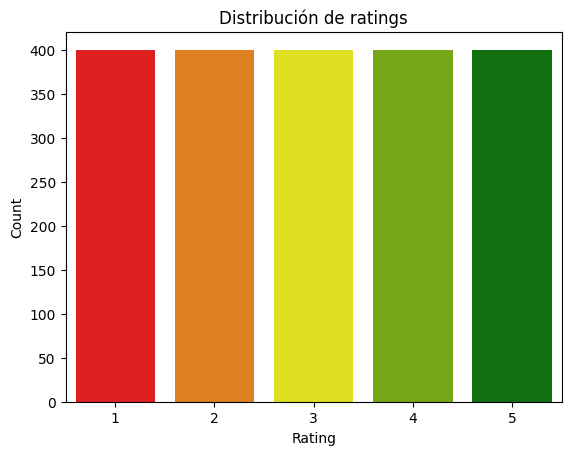

In [7]:
from matplotlib.colors import LinearSegmentedColormap


# Define the colors: red for 1, blue for 5
colors = LinearSegmentedColormap.from_list("red_to_blue", ["red","yellow", "green"])

# Create a palette for ratings 1 to 5
ratings_range = range(1, 6)  # Ratings from 1 to 5
palette = sns.color_palette(colors(np.linspace(0, 1, len(ratings_range))))

# Plot the countplot with the custom palette
sns.countplot(x='reviews.rating', data=data, palette=palette)

# Add labels and title
plt.title('Distribución de ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

Mapeo de score de sentimientos a Positivo o negativo:

In [8]:
# map ratings 1, 2, 3 a 0 (NEGATIVE) y 4, 5 a 1 (POSITIVE)

sentiment_score = {1: 0,
                   2: 0,
                   3: 0,
                   4: 1,
                   5: 1}

sentiment = {0: 'NEGATIVE',
             1: 'POSITIVE'}

# mapping
data['sentiment_score'] = data['reviews.rating'].map(sentiment_score)
data['sentiment'] = data['sentiment_score'].map(sentiment)

data.head()

## Map es una funcion util y puede usarse como alternativa a los fors.
# list(map(funcion, lista))
#numbers = [10, 15, 21, 33, 42, 55]
#mapped_numbers = list(map(lambda x: x * 2 + 3, numbers))

,id,reviews.text,reviews.rating,reviews.text_esp,sentiment_score,sentiment
0,AVqVGWQDv8e3D1O-ldFr,This is a very nice tablet for my GF who has n...,5,Esta es una tableta muy agradable para mi novi...,1,POSITIVE
1,AVqkIhwDv8e3D1O-lebb,Love this tablet. Easy to use. And price was r...,5,Me encanta esta tableta. Fácil de usar. Y el p...,1,POSITIVE
2,AVphgVaX1cnluZ0-DR74,Affordable price awesome quality I love my Ama...,5,Precio asequible calidad increíble Me encanta ...,1,POSITIVE
3,AVphgVaX1cnluZ0-DR74,I bought this after speaking with a sales rep ...,5,Compré esto después de hablar con un represent...,1,POSITIVE
4,AVqVGWLKnnc1JgDc3jF1,Bought this tablet for my 2 &1/2 year old and ...,5,Compré esta tableta para mi hijo de 2 años y m...,1,POSITIVE


Visualización de distribución de sentimientos a partir del score inicial:

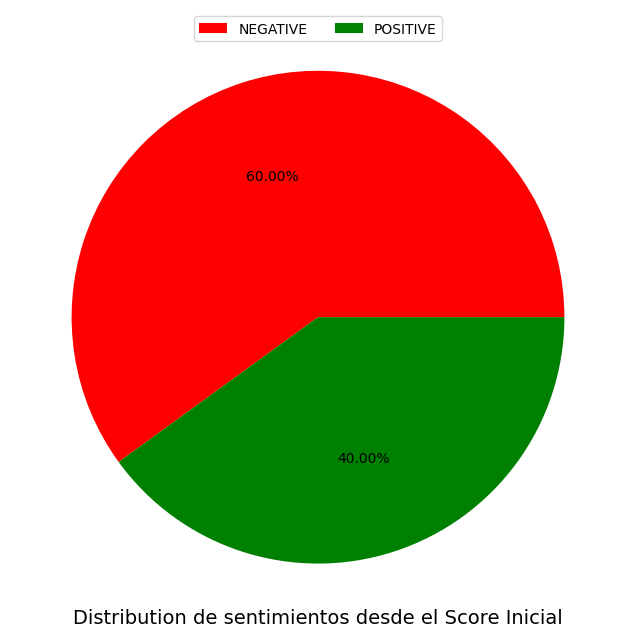

In [9]:
# distribution of sentiment
plt.figure(figsize = (8, 8))

labels = ['NEGATIVE','POSITIVE']
colors = ['red', 'green']
plt.pie(data['sentiment'].value_counts(), autopct='%0.2f%%',colors=colors)

plt.title('Distribution de sentimientos desde el Score Inicial', size=14, y=-0.01,)
plt.legend(labels, ncol=2, loc=9)
plt.show()

**2) PROCESAMIENTO DE LENGUAJE DE NATURAL:**

Importación de librerías requeridas para el procesamiento:

In [10]:
pip install wordcloud

In [11]:
import re
import string

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
from nltk.corpus import wordnet
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from collections import Counter




In [12]:
pip install unidecode

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.8/235.8 kB 11.5 MB/s eta 0:00:00


Creación del diccionario de stopwords en español:

In [13]:
# Eliminamos stopwords
from nltk.corpus import stopwords
import unidecode
nltk.download('stopwords')
stopwords = set(stopwords.words("spanish"))


# Creamos un diccionario de stopwords en español
stopwords = [unidecode.unidecode(i) for i in stopwords]
stopwords = set(stopwords)
stop_words=list(stopwords)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Limpieza de texto:

In [14]:
## Limpieza de texto.
def clean_text(txt:str)-> str:

    out = str(txt)

    out = out.lower()
    out = out.strip()

    out = re.sub(' \d+', ' ', out)

    out = re.compile('<.*?>').sub('', out)
    out = re.compile('[%s]' % re.escape(string.punctuation)).sub(' ', out)
    out = re.sub('\s+', ' ', out)
    out = ' '.join(word for word in out.split() if len(word) > 2)
    out = out.strip()


    return out

def stopword(string):
    a= [i for i in string.split() if i not in stopwords]
    return ' '.join(a)

<>:9: SyntaxWarning: invalid escape sequence '\d'
<>:13: SyntaxWarning: invalid escape sequence '\s'
<>:9: SyntaxWarning: invalid escape sequence '\d'
<>:13: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-3673049140.py:9: SyntaxWarning: invalid escape sequence '\d'
  out = re.sub(' \d+', ' ', out)
/tmp/ipython-input-3673049140.py:13: SyntaxWarning: invalid escape sequence '\s'
  out = re.sub('\s+', ' ', out)


Remoción de stopwords:

In [15]:
# remove stopwords
data['text'] = data['reviews.text_esp'].apply(clean_text)
data['text']=data['text'].apply(stopword)

Remoción de acentos:

In [16]:
data['text']=data['text'].str.replace("á","a").str.replace("é","e").str.replace("í","i").str.replace("ó","o").str.replace("ú","u")

In [17]:
from nltk.stem import SnowballStemmer
spanish_stemmer = SnowballStemmer('spanish')

def stemmer(texto):
    return(spanish_stemmer.stem(texto))


Alimentación de raices (Stems):

In [18]:
data['text_stemmed']=data['text'].apply(stemmer)

**3) OBSERVACIÓN DE NUBES DE PALABRAS**

Creación de conjuntos de datos de palabras y raices:

In [19]:
# Graficos de palbras.

# todas las palabras
all_words = pd.Series(' '.join(data['text']).split())
all_stems = pd.Series(' '.join(data['text_stemmed']).split())

Creación de nubes de palabras en paralelo de palabras y raíces:

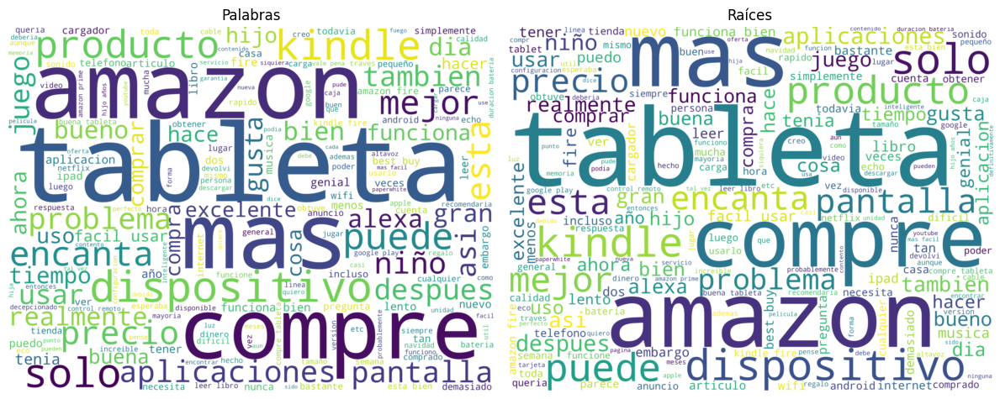

In [20]:
# plot word cloud
wordcloud1 = WordCloud(width = 4000, height = 3000, background_color='white').generate(' '.join(all_words))
wordcloud2 = WordCloud(width = 4000, height = 3000, background_color='white').generate(' '.join(all_stems))

# Create subplots
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display the first word cloud
ax[0].imshow(wordcloud1, interpolation='bilinear')
ax[0].axis('off')  # Turn off axis
ax[0].set_title("Palabras")

# Display the second word cloud
ax[1].imshow(wordcloud2, interpolation='bilinear')
ax[1].axis('off')  # Turn off axis
ax[1].set_title("Raíces")

# Adjust layout and display
plt.tight_layout()
plt.show()

Creación de nubes de palabras de opiniones positivas:

In [21]:
# get words used positive reivews
positiveWords = pd.Series(' '.join(data[data['sentiment']=='POSITIVE']['text']).split())

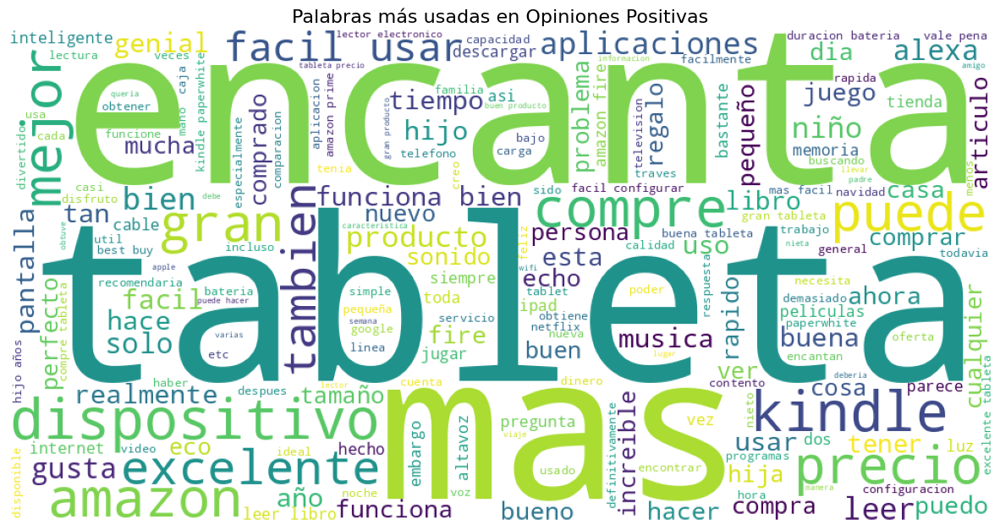

In [22]:
# plot word cloud
wordcloud = WordCloud(width = 1000, height = 500, background_color='white').generate(' '.join(positiveWords))

plt.figure(figsize=(15,8))

plt.imshow(wordcloud)
plt.title("Palabras más usadas en Opiniones Positivas", size=16)

plt.axis("off")
plt.show()

Creación de nubes de palabras de opiniones negativas:

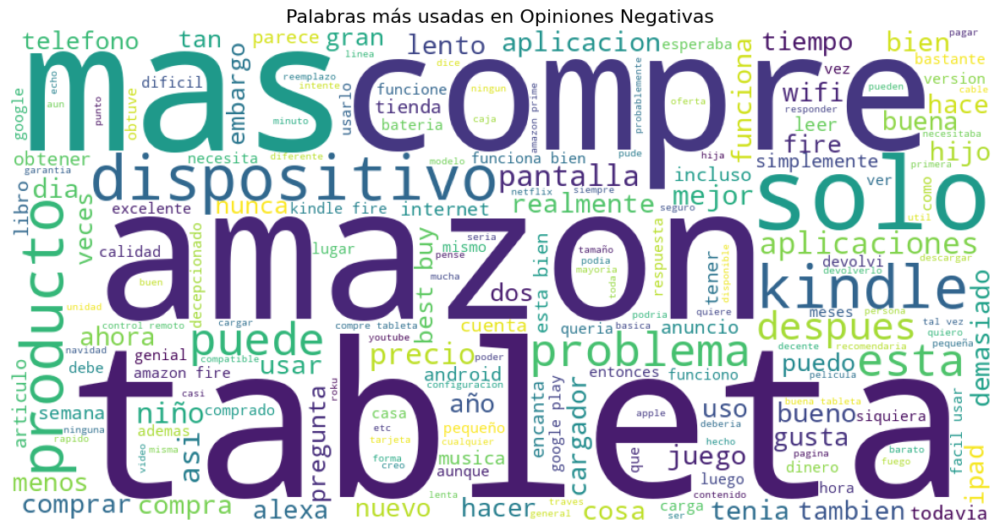

In [23]:
# get words used positive reivews
negativeWords = pd.Series(' '.join(data[data['sentiment']=='NEGATIVE']['text']).split())
# plot word cloud
wordcloud = WordCloud(width = 1000, height = 500, background_color='white').generate(' '.join(negativeWords))

plt.figure(figsize=(15,8))

plt.imshow(wordcloud)
plt.title("Palabras más usadas en Opiniones Negativas", size=16)

plt.axis("off")
plt.show()

**4) APLICACION DE PAQUETE SENTIMENT ANALYSIS EN ESPAÑOL:**

In [24]:
pip install sentiment_analysis_spanish

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.0/30.0 MB 49.4 MB/s eta 0:00:00


Se crea una función que aplica el análisis de sentimiento calculando un "score" siendo 0 un resultado más negativo y 1 un resultado más positivo.

In [25]:
from sentiment_analysis_spanish import sentiment_analysis
def analysis_sentimientos(x):
    sa=sentiment_analysis.SentimentAnalysisSpanish()
    return(sa.sentiment(x))

In [26]:
## Seleccionar una muestra
data5 = data[data['reviews.rating']==5].sample(20,random_state=43)
data4 = data[data['reviews.rating']==4].sample(20,random_state=43)
data3 = data[data['reviews.rating']==3].sample(20,random_state=43)
data2 = data[data['reviews.rating']==2].sample(20,random_state=43)
data1 = data[data['reviews.rating']==1].sample(20,random_state=43)

data2 = pd.concat([data5,data4,data3,data2,data1])

In [27]:
data2.reset_index(drop=True, inplace=True)

In [28]:
'''#data["score"]=data["text"].apply(analysis_sentimientos)
data2["score"]=data2["text"].apply(analysis_sentimientos)

#demora aprox 13 mins'''

'#data["score"]=data["text"].apply(analysis_sentimientos)\ndata2["score"]=data2["text"].apply(analysis_sentimientos)\n\n#demora aprox 13 mins'

In [29]:
from joblib import Parallel, delayed
data2["score_SA"] = Parallel(n_jobs=8)(delayed(analysis_sentimientos)(text) for text in data2["text"])

#Corrió en 10 mins con 4 jobs y

In [30]:
data2.iloc[23]["reviews.text_esp"]

'Compré esto para mi novia ya que ella está en su teléfono jugando, etc. Lo he usado varias veces y me gusta.'

In [31]:
data2["score_SA"][23]

np.float64(0.03168503602670283)

In [32]:
data2["score_SA"]

,score_SA
0,0.977333
1,0.620469
2,0.637174
3,0.059778
4,0.115839
...,...
95,0.010412
96,0.050917
97,0.047558
98,0.005742


In [33]:
data2

,id,reviews.text,reviews.rating,reviews.text_esp,sentiment_score,sentiment,text,text_stemmed,score_SA
0,AVpfpK8KLJeJML43BCuD,This speaker has a great sound and its perfect...,5,Este altavoz tiene un gran sonido y es perfect...,1,POSITIVE,altavoz gran sonido perfecto salir patio cualq...,altavoz gran sonido perfecto salir patio cualq...,0.977333
1,AVpfl8cLLJeJML43AE3S,While I purchased this item as a gift for my s...,5,Si bien compré este artículo como regalo para ...,1,POSITIVE,bien compre articulo regalo hijo resulto ser m...,bien compre articulo regalo hijo resulto ser m...,0.620469
2,AVpfl8cLLJeJML43AE3S,I love my Echo that I received for Christmas f...,5,Me encanta mi Echo que recibí en Navidad de mi...,1,POSITIVE,encanta echo recibi navidad esposa compre yern...,encanta echo recibi navidad esposa compre yern...,0.637174
3,AV1YnRtnglJLPUi8IJmV,Does all they claim. Am really enjoying my new...,5,Hace todo lo que dicen. Realmente estoy disfru...,1,POSITIVE,hace dicen realmente disfrutando nuevo kindle,hace dicen realmente disfrutando nuevo kindl,0.059778
4,AVpjEN4jLJeJML43rpUe,Good way to get started for kids to play with ...,5,Buena manera de empezar para que los niños jue...,1,POSITIVE,buena manera empezar niños jueguen puedan apre...,buena manera empezar niños jueguen puedan aprend,0.115839
...,...,...,...,...,...,...,...,...,...
95,AV1YE_muvKc47QAVgpwE,Bought two of these 2015 models to add to my p...,1,Compré dos de estos modelos 2015 para agregar ...,0,NEGATIVE,compre dos modelos agregar modelo anterior jue...,compre dos modelos agregar modelo anterior jue...,0.010412
96,AVphgVaX1cnluZ0-DR74,Bought for my grandson he doesn't like it it's...,1,"Comprado para mi nieto, no le gusta, es demasi...",0,NEGATIVE,comprado nieto gusta demasiado lento,comprado nieto gusta demasiado lent,0.050917
97,AVpfIfGA1cnluZ0-emyp,1 star...because it worked 1 time and stopped ...,1,1 estrella... porque funcionó 1 vez y dejó de ...,0,NEGATIVE,estrella funciono vez dejo funcionar ¡lo devol...,estrella funciono vez dejo funcionar ¡lo devol...,0.047558
98,AVphgVaX1cnluZ0-DR74,"My grand kid didn't like device, get frustrate...",1,"A mi nieto no le gustaba el dispositivo, se fr...",0,NEGATIVE,nieto gustaba dispositivo frustraba navegar vi...,nieto gustaba dispositivo frustraba navegar vi...,0.005742


In [34]:
resultados=data2[["sentiment","score_SA","reviews.text_esp","sentiment_score","reviews.rating"]]

In [35]:
pd.set_option('display.max_colwidth', None)

In [36]:
resultados[resultados["reviews.rating"]==5]

,sentiment,score_SA,reviews.text_esp,sentiment_score,reviews.rating
0,POSITIVE,0.977333,"Este altavoz tiene un gran sonido y es perfecto para salir al patio o en cualquier habitación en la que me encuentre. El toque es molesto en comparación con el Echo con activación por voz, pero las funciones inalámbricas hacen que la compra valga la pena.",1,5
1,POSITIVE,0.620469,"Si bien compré este artículo como regalo para mi hijo, resultó ser una de las mejores elecciones que pude haber hecho. Ama a Alexa y la capacidad de preguntarle lo que parece estar en su mente. Echo es un complemento maravilloso para la disponibilidad de información y la tecnología de la información para mejorar nuestras vidas. Un gran regalo y un artículo muy útil.",1,5
2,POSITIVE,0.637174,Me encanta mi Echo que recibí en Navidad de mi esposa que se lo compré a mi yerno por su cumpleaños. Tiene Amazon prime para que pueda hacer mucho más con el Echo. Me suscribiré también.,1,5
3,POSITIVE,0.059778,Hace todo lo que dicen. Realmente estoy disfrutando de mi nuevo Kindle.,1,5
4,POSITIVE,0.115839,Buena manera de empezar para que los niños jueguen y puedan aprender.,1,5
5,POSITIVE,0.531025,Siento que esta tableta fue perfecta para mis hijos de 8 y 6 años.,1,5
6,POSITIVE,0.337111,Kindle Paprrwjite es el mejor lector electrónico que existe. ¡A por ello!,1,5
7,POSITIVE,0.417093,"Amazon Echo puede hacerlo todo. Lo uso principalmente para reproducir música, configurar temporizadores y hacerle preguntas, pero eventualmente lo usaré para controlar los artículos del hogar.",1,5
8,POSITIVE,0.900524,Súper divertido de conectar con bombillas inteligentes y enchufes inteligentes: te hace sentir como si tuvieras una casa Jetson. Los resúmenes informativos personalizados también son una buena manera de comenzar el día.,1,5
9,POSITIVE,0.988740,"Compré esto en lugar del Fire Stick para emparejarlo con mi nuevo televisor 4K. Fácil de usar, gran selección, diseño pequeño y elegante se combina con mi sistema de entretenimiento.",1,5


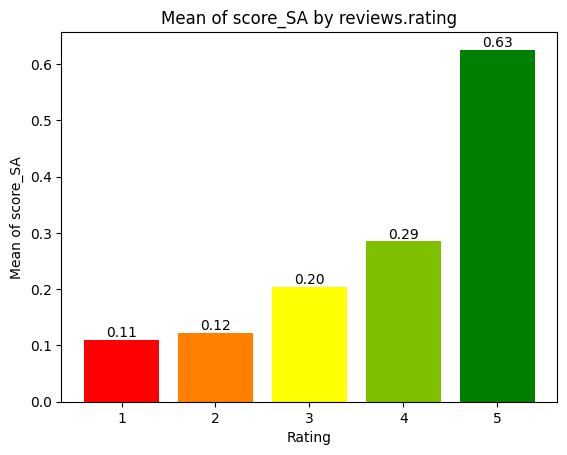

In [37]:
# Aggregate data: Calculate the mean of score_SA for each reviews.rating
mean_scores = data2.groupby('reviews.rating')['score_SA'].mean().reset_index()

# Define the custom colormap (red to green)
colors = LinearSegmentedColormap.from_list("red_to_green", ["red","yellow", "green"])

# Create a palette for ratings 1 to 5
ratings_range = range(1, 6)  # Ratings from 1 to 5
palette = sns.color_palette(colors(np.linspace(0, 1, len(ratings_range))))

# Map the palette to the ratings for consistent coloring
color_mapping = dict(zip(ratings_range, palette))
bar_colors = mean_scores['reviews.rating'].map(color_mapping)

# Plot the bar chart
bars = plt.bar(mean_scores['reviews.rating'], mean_scores['score_SA'], color=bar_colors)

# Annotate each bar with its mean score_SA value
for bar, score in zip(bars, mean_scores['score_SA']):
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
        bar.get_height(),  # Y position (top of the bar)
        f'{score:.2f}',  # Format the value to 2 decimal places
        ha='center',  # Horizontal alignment
        va='bottom'  # Vertical alignment
    )


# Add labels and title
plt.title('Mean of score_SA by reviews.rating')
plt.xlabel('Rating')
plt.ylabel('Mean of score_SA')
plt.xticks(ratings_range)  # Ensure x-axis ticks match the ratings
plt.show()

La gráfica muestra que tiene lógica el valor otorgado a través del análisis de texto vs. el rating otorgado en el comentario.

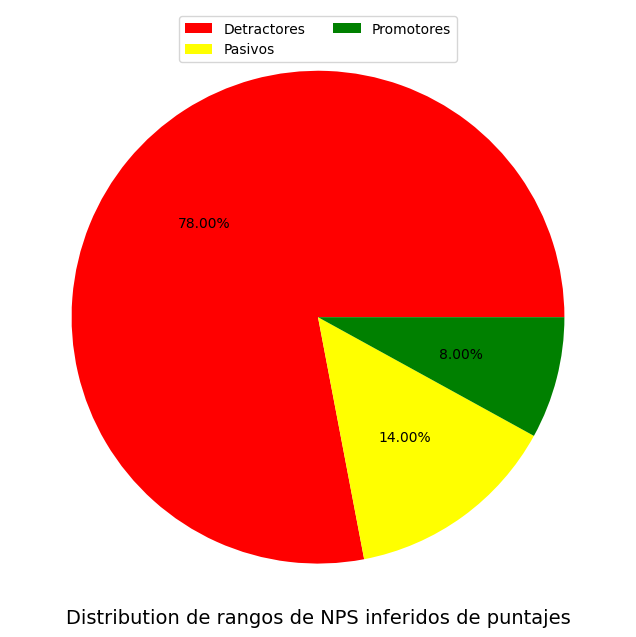

In [38]:
def assign_category(score):
    if score <= 0.6:
        return "detractor"
    elif 0.6 < score <= 0.8:
        return "pasivo"
    elif 0.8 < score <= 1:
        return "promotor"

# Apply the function to create a new column
data2['categorySA'] = data2['score_SA'].apply(assign_category)

# distribution of sentiment
plt.figure(figsize = (8, 8))

labels = ['Detractores','Pasivos','Promotores']
colors = ['red','yellow', 'green']
plt.pie(data2['categorySA'].value_counts(), autopct='%0.2f%%',colors=colors)

plt.title('Distribution de rangos de NPS inferidos de puntajes', size=14, y=-0.01,)
plt.legend(labels, ncol=2, loc=9)
plt.show()


In [39]:
data2[data2['categorySA']=='promotor'][['reviews.text_esp','score_SA']]

,reviews.text_esp,score_SA
0,"Este altavoz tiene un gran sonido y es perfecto para salir al patio o en cualquier habitación en la que me encuentre. El toque es molesto en comparación con el Echo con activación por voz, pero las funciones inalámbricas hacen que la compra valga la pena.",0.977333
8,Súper divertido de conectar con bombillas inteligentes y enchufes inteligentes: te hace sentir como si tuvieras una casa Jetson. Los resúmenes informativos personalizados también son una buena manera de comenzar el día.,0.900524
9,"Compré esto en lugar del Fire Stick para emparejarlo con mi nuevo televisor 4K. Fácil de usar, gran selección, diseño pequeño y elegante se combina con mi sistema de entretenimiento.",0.988740
11,La navegación en la tableta es fácil de usar. Es genial para transmitir películas. peso ligero y compacto.,0.902817
12,En este momento perfecto y cercano al eReader de libros en el mundo actual. Tus ojos no te harán daño. Buen trato en Bestbuy,0.999455
17,"Esta sería una gran tableta incluso si costara $ 100. Recogerlo el Black Friday fue literalmente una obviedad. Lo vi, miré el precio, lo recogí y lo compré. Es ideal para usuarios de todas las edades. No es genial para juegos gráficamente intensos, pero si quieres eso, debes pagar por ello. Para una tableta informal para todos los días (también excelente para ver películas mientras viaja), no hay nada mejor.",0.991228
18,"Es el regalo perfecto, no demasiado grande, no demasiado pequeño... perfecto",0.997495
19,Simplemente genial y fácil de configurar!!! Recomendaría esto a cualquiera.,0.849810
27,"Gran tableta pero poco almacenamiento interno y no permite mucha ""personalización"" de la pantalla de inicio y otras pantallas.",0.909861
33,¡Excelente para el uso diario! ¡El precio es correcto! ¡Fácil de configurar y usar!,0.934288


In [40]:
data2[data2['categorySA']=='detractor'][['reviews.text_esp','score_SA']]

,reviews.text_esp,score_SA
3,Hace todo lo que dicen. Realmente estoy disfrutando de mi nuevo Kindle.,0.059778
4,Buena manera de empezar para que los niños jueguen y puedan aprender.,0.115839
5,Siento que esta tableta fue perfecta para mis hijos de 8 y 6 años.,0.531025
6,Kindle Paprrwjite es el mejor lector electrónico que existe. ¡A por ello!,0.337111
7,"Amazon Echo puede hacerlo todo. Lo uso principalmente para reproducir música, configurar temporizadores y hacerle preguntas, pero eventualmente lo usaré para controlar los artículos del hogar.",0.417093
...,...,...
95,"Compré dos de estos modelos 2015 para agregar a mi modelo anterior en otros juegos de la casa. Ambas unidades nuevas se congelan después de unos 10 a 15 minutos, lo que indica que la velocidad de mi conexión de 16 MB no es lo suficientemente rápida para ver documentales antiguos desde mi cuenta Prime. Ciclar la energía hace que funcione hasta que se congele nuevamente. El modelo antiguo funciona perfectamente. Voy a devolver estos.",0.010412
96,"Comprado para mi nieto, no le gusta, es demasiado lento.",0.050917
97,1 estrella... porque funcionó 1 vez y dejó de funcionar. ¡Lo devolví al día siguiente! ¡El cargador Nexus de mi esposo y el cargador Belkin de 10 W (que consiguió para reemplazar este cargador) hacen un GRAN trabajo cargando mi Kindle Fire 8.9 HDX!,0.047558
98,"A mi nieto no le gustaba el dispositivo, se frustraba al navegar por el video educativo. ¡No vale la pena!",0.005742


# *Ejemplo usando la Bag of Words:*



"Bag of Words" (BoW) es un método utilizado en el procesamiento de lenguaje natural para representar el texto como una matriz de conteo de palabras. En el análisis de sentimientos, el BoW se utiliza para extraer características del texto que luego se utilizan para clasificarlo como positivo o negativo.

La idea detrás de BoW es tratar cada documento (en este caso, una reseña o comentario) como una "bolsa" de palabras, ignorando el orden en que aparecen en el texto y solo contando su frecuencia. El proceso implica los siguientes pasos:

Tokenización: el texto se divide en palabras individuales, eliminando la puntuación y los caracteres especiales.

Creación de vocabulario: se crea una lista de todas las palabras únicas en todo el corpus de texto.

Vectorización: se crea una matriz donde cada fila representa un documento y cada columna representa una palabra única. El valor en cada celda representa la frecuencia de esa palabra en ese documento.

Normalización: las frecuencias se ajustan para tener en cuenta la longitud del documento y la frecuencia de la palabra en todo el corpus.

Una vez que se ha creado la matriz de BoW, se puede usar para entrenar un modelo de clasificación, como la regresión logística, que puede predecir si una reseña o comentario es positivo o negativo en función de las palabras que contiene. El modelo se entrena utilizando un conjunto de datos de entrenamiento etiquetado que contiene reseñas o comentarios positivos y negativos.

**1) TRADUCCIÓN DEL TEXTO A INGLÉS:**

In [41]:
pip install requests pandas

Traducción usando una API no oficial de Google:

In [42]:
import requests



# Function to translate text using Google Translate unofficial API
def translate_text(text):
    try:
        url = "https://translate.googleapis.com/translate_a/single"
        params = {
            "client": "gtx",
            "sl": "es",  # Source language
            "tl": "en",  # Target language
            "dt": "t",
            "q": text,
        }
        response = requests.get(url, params=params)
        response.raise_for_status()  # Check for HTTP request errors
        # Join all segments of the response into one translated text
        translated_segments = [segment[0] for segment in response.json()[0]]
        return " ".join(translated_segments)  # Combine all segments
    except Exception as e:
        print(f"Translation error for '{text}': {e}")
        return text  # Return original text if translation fails

# Apply the translation function to the DataFrame
data['TextTraducido'] = data['text'].apply(translate_text)

# Display the DataFrame
data[['text', 'TextTraducido']]

,text,TextTraducido
0,tableta agradable novia nunca habia,tablet nice girlfriend never had
1,encanta tableta facil usar precio correcto,love tablet easy to use right price
2,precio asequible calidad increible encanta tableta amazon fire,affordable price amazing quality love amazon fire tablet
3,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindle,buy later talk sales representative tigertown buy son loves second kindle
4,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahora,buy tablet son years old perfect games videos come age appropriate tablet been durable now
...,...,...
1995,devuelvo viene nueva version,I return a new version comes
1996,sorprendio descubrir venia ningun tipo cable carga asi comprar luego descubri cargador sprint htc mas rapido volveria comprar primer articulo gustado comprado amazon,I was surprised to discover that it came with no type of charging cable so buy then I discovered the sprint htc charger faster I would buy again first item liked bought amazon
1997,esperaba version mas grande hdx correo electronico malo tambien calendario,I was expecting a larger version hdx bad email also calendar
1998,nunca compre articulo absoluto asi supongo debes tener persona equivocada,I never bought an absolute item so I guess you must have the wrong person.


In [43]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.utils import shuffle

Cargue de stopwords:

In [44]:
stopwords = nltk.corpus.stopwords.words("english")

Definición de función para eliminar stopwords y aplicación de la misma:

In [45]:
def stopword(string):
    a= [i for i in string.split() if i not in stopwords]
    return ' '.join(a)

In [46]:
data["TextTraducido"]=data["TextTraducido"].apply(stopword)

**2) CREACIÓN DEL VECTOR**

Count Vector es una técnica de vectorización de texto que se utiliza para convertir el texto en una matriz numérica de conteo de palabras. Esta técnica forma parte del proceso de Bag of Words (BoW) que se utiliza en el análisis de texto.

La técnica de Count Vector implica los siguientes pasos:

* Tokenización: el texto se divide en palabras individuales.

* Creación de vocabulario: se crea una lista de todas las palabras únicas en todo el corpus de texto.

* Conteo de palabras: se cuenta la frecuencia de cada palabra en cada documento.

* Vectorización: se crea una matriz donde cada fila representa un documento y cada columna representa una palabra única. El valor en cada celda representa el número de veces que aparece esa palabra en ese documento.

El resultado final es una matriz de números enteros que representa el conteo de palabras en cada documento. Esta matriz se puede utilizar para entrenar un modelo de aprendizaje automático para el análisis de texto, como la regresión logística o el árbol de decisión.

In [47]:
from sklearn.feature_extraction.text import CountVectorizer

In [48]:
import pandas

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()

bowmatrix = vectorizer.fit_transform(data["TextTraducido"])

In [49]:
bowmatrix.toarray().shape

(2000, 3861)

In [50]:
print(bowmatrix.toarray())

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


**3) STEMMING (LEMATIZACIÓN)**

In [51]:
from nltk.stem import PorterStemmer, WordNetLemmatizer
porter_stemmer = PorterStemmer()

In [52]:
def stem_sentences(sentence):
    tokens = sentence.split()
    stemmed_tokens = [porter_stemmer.stem(token) for token in tokens]
    return ' '.join(stemmed_tokens)

data["TextTraducidoStem"] = data["TextTraducido"].apply(stem_sentences)

In [53]:
data[["TextTraducido","TextTraducidoStem"]]

,TextTraducido,TextTraducidoStem
0,tablet nice girlfriend never,tablet nice girlfriend never
1,love tablet easy use right price,love tablet easi use right price
2,affordable price amazing quality love amazon fire tablet,afford price amaz qualiti love amazon fire tablet
3,buy later talk sales representative tigertown buy son loves second kindle,buy later talk sale repres tigertown buy son love second kindl
4,buy tablet son years old perfect games videos come age appropriate tablet durable,buy tablet son year old perfect game video come age appropri tablet durabl
...,...,...
1995,I return new version comes,i return new version come
1996,I surprised discover came type charging cable buy I discovered sprint htc charger faster I would buy first item liked bought amazon,i surpris discov came type charg cabl buy i discov sprint htc charger faster i would buy first item like bought amazon
1997,I expecting larger version hdx bad email also calendar,i expect larger version hdx bad email also calendar
1998,I never bought absolute item I guess must wrong person.,i never bought absolut item i guess must wrong person.


**4) IMPORTACIÓN DE DICCIONARIO PARA ANÁLISIS DE SENTIMIENTOS DE NLTK:**

In [54]:
nltk.download('opinion_lexicon')

[nltk_data] Downloading package opinion_lexicon to /root/nltk_data...
[nltk_data]   Unzipping corpora/opinion_lexicon.zip.


True

In [55]:
from nltk.corpus import opinion_lexicon

Creación de listads de palabras positivas y negativas:

In [56]:
pos_list=set(opinion_lexicon.positive())
neg_list=set(opinion_lexicon.negative())

In [57]:
neg_list

{'intrusive',
 'carelessness',
 'damage',
 'miscalculate',
 'lure',
 'brashly',
 'skeletons',
 'acerbate',
 'fustigate',
 'decrepit',
 'backwoods',
 'brazenness',
 'pestilent',
 'slanders',
 'stupified',
 'overlook',
 'overzelous',
 'sceptical',
 'zealous',
 'top-heavy',
 'accidental',
 'gallingly',
 'fussy',
 'arrogantly',
 'cons',
 'banalize',
 'symptom',
 'temerity',
 'grouse',
 'dilly-dally',
 'averse',
 'indiscernible',
 'startle',
 'tramp',
 'quack',
 'bitter',
 'bombard',
 'punish',
 'falling',
 'fanatical',
 'vibrated',
 'ruined',
 'belligerent',
 'grudgingly',
 'cumbersome',
 'treacherously',
 'desperate',
 'fiendish',
 'busybody',
 'loneliness',
 'stunt',
 'unproving',
 'unclear',
 'unsettled',
 'woe',
 'laughably',
 'scuff',
 'ulterior',
 'contravene',
 'covetous',
 'apprehension',
 'vice',
 'vindictive',
 'pedantic',
 'rankle',
 'faulty',
 'allergic',
 'horrible',
 'pitiable',
 'manipulators',
 'prejudge',
 'indifference',
 'violent',
 'wheedle',
 'revoltingly',
 'ineptitud

In [58]:
pos_list

{'courageousness',
 'entertain',
 'agilely',
 'enthusiast',
 'overtook',
 'loves',
 'peach',
 'hearten',
 'affable',
 'illuminati',
 'entice',
 'appreciated',
 'sprightly',
 'amusingly',
 'credible',
 'worth-while',
 'prudent',
 'beauty',
 'honored',
 'desiring',
 'succes',
 'outstandingly',
 'immaculate',
 'futurestic',
 'glistening',
 'keen',
 'praise',
 'productively',
 'boost',
 'genius',
 'palatial',
 'gaining',
 'attractive',
 'refreshing',
 'realistic',
 'modern',
 'well-managed',
 'eyecatch',
 'enviably',
 'fortunately',
 'pleased',
 'steady',
 'skillfully',
 'harmonious',
 'handily',
 'miraculously',
 'levity',
 'excitedness',
 'securely',
 'crisp',
 'panoramic',
 'statuesque',
 'colorful',
 'striking',
 'a+',
 'superiority',
 'sensational',
 'impartiality',
 'shiny',
 'dynamic',
 'convienient',
 'exhilarating',
 'profoundly',
 'compactly',
 'earnestly',
 'bloom',
 'breeze',
 'preferes',
 'bravo',
 'awestruck',
 'stimulates',
 'affably',
 'clever',
 'undisputably',
 'protectio

In [59]:
def sentiment_dictionary(x):
    pos=0
    neg=0
    for i in x.split():
        if i in pos_list:
            pos+=1
        if i in neg_list:
            neg+=1
    la={}
    la['positive']=(pos/len(x.split()))*100
    try:
        la['negative']=(neg/len(x.split()))*100
    except:la['negative']=0
    return la

In [60]:
data['SentimenDictPorcPos'] = data['TextTraducido'].apply(lambda x: sentiment_dictionary(x)['positive'])
data['SentimenDictPorcNeg'] = data['TextTraducido'].apply(lambda x: sentiment_dictionary(x)['negative'])

# Display the updated DataFrame
data.head()

,id,reviews.text,reviews.rating,reviews.text_esp,sentiment_score,sentiment,text,text_stemmed,TextTraducido,TextTraducidoStem,SentimenDictPorcPos,SentimenDictPorcNeg
0,AVqVGWQDv8e3D1O-ldFr,This is a very nice tablet for my GF who has never had one before.,5,Esta es una tableta muy agradable para mi novia que nunca antes había tenido una.,1,POSITIVE,tableta agradable novia nunca habia,tableta agradable novia nunca habi,tablet nice girlfriend never,tablet nice girlfriend never,25.000000,0.0
1,AVqkIhwDv8e3D1O-lebb,Love this tablet. Easy to use. And price was right,5,Me encanta esta tableta. Fácil de usar. Y el precio era correcto,1,POSITIVE,encanta tableta facil usar precio correcto,encanta tableta facil usar precio correct,love tablet easy use right price,love tablet easi use right price,50.000000,0.0
2,AVphgVaX1cnluZ0-DR74,Affordable price awesome quality I love my Amazon fire tablet,5,Precio asequible calidad increíble Me encanta mi tableta Amazon Fire,1,POSITIVE,precio asequible calidad increible encanta tableta amazon fire,precio asequible calidad increible encanta tableta amazon fir,affordable price amazing quality love amazon fire tablet,afford price amaz qualiti love amazon fire tablet,37.500000,0.0
3,AVphgVaX1cnluZ0-DR74,I bought this after speaking with a sales rep in Tigertown. I bought this for my kid and he loves it. Its my 2nd kindle.,5,Compré esto después de hablar con un representante de ventas en Tigertown. Compré esto para mi hijo y le encanta. Es mi segundo kindle.,1,POSITIVE,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindle,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindl,buy later talk sales representative tigertown buy son loves second kindle,buy later talk sale repres tigertown buy son love second kindl,9.090909,0.0
4,AVqVGWLKnnc1JgDc3jF1,Bought this tablet for my 2 &1/2 year old and it is perfect. Games and videos that come on it are very age appropriate and the tablet has been very durable thus far.,5,Compré esta tableta para mi hijo de 2 años y medio y es perfecta. Los juegos y videos que vienen son muy apropiados para la edad y la tableta ha sido muy duradera hasta ahora.,1,POSITIVE,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahora,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahor,buy tablet son years old perfect games videos come age appropriate tablet durable,buy tablet son year old perfect game video come age appropri tablet durabl,23.076923,0.0


In [61]:
data["sentimentPorc"]=""
for i in range(0, len(data)):

    if data.SentimenDictPorcPos[i]/data.SentimenDictPorcNeg[i] > 1.2:
        data["sentimentPorc"][i] = "POSITIVE"
    elif data.SentimenDictPorcNeg[i]/data.SentimenDictPorcPos[i] > 1.2:
        data["sentimentPorc"][i] ="NEGATIVE"
    else:
        data["sentimentPorc"][i] ="NEUTRAL"

/tmp/ipython-input-1164938597.py:4: RuntimeWarning: divide by zero encountered in scalar divide
  if data.SentimenDictPorcPos[i]/data.SentimenDictPorcNeg[i] > 1.2:
/tmp/ipython-input-1164938597.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-cop

In [62]:
sentiment_dictionary(data["TextTraducido"][1])

{'positive': 50.0, 'negative': 0.0}

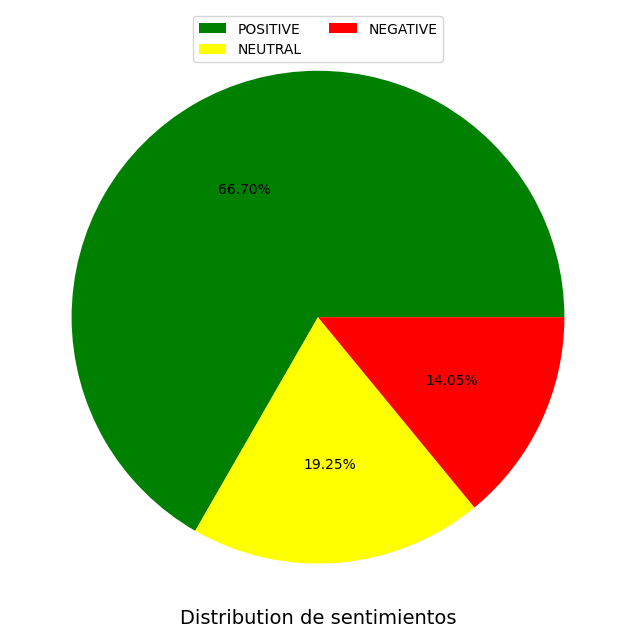

In [63]:
# distribution of sentiment
plt.figure(figsize = (8, 8))

labels = ['POSITIVE',"NEUTRAL",'NEGATIVE']
colors = ['green', 'yellow','red']
plt.pie(data['sentimentPorc'].value_counts(), autopct='%0.2f%%',colors=colors)

plt.title('Distribution de sentimientos', size=14, y=-0.01)
plt.legend(labels, ncol=2, loc=9)
plt.show()

# *Ejemplo usando NLTK Sentiment Intensity Analyzer:*

¿Cómo funciona?
Léxico predefinido:

Utiliza un diccionario de palabras, donde cada palabra tiene asignada una puntuación de sentimiento (positiva, negativa o neutral).

Ejemplo: "excelente" tendrá una puntuación positiva alta, mientras que "horrible" tendrá una negativa alta.
Modificadores contextuales:

SIA considera el contexto de las palabras. Por ejemplo:
Negaciones: Frases como "no está bien" se interpretan
correctamente como negativas.
* Intensificadores: Palabras como "muy" o "extremadamente" modifican la intensidad del sentimiento.
* Puntuación: La puntuación como signos de exclamación o mayúsculas afecta el puntaje, capturando la emoción añadida.
Puntuaciones:

SIA genera cuatro puntuaciones principales:
* Positiva: Nivel de contenido positivo en el texto.
* Negativa: Nivel de contenido negativo.
* Neutral: Porcentaje del texto sin polaridad significativa.
* Compuesto: Un puntaje global que va de -1 (totalmente negativo) a 1 (totalmente positivo).

Descarga del lexico e importación del Analizador de intensidad de sentimientos.

In [64]:
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Ejemplo de calculo de polaridad:

In [65]:
sia.polarity_scores(data["TextTraducido"][1])

{'neg': 0.0, 'neu': 0.36, 'pos': 0.64, 'compound': 0.7964}

In [66]:
data

,id,reviews.text,reviews.rating,reviews.text_esp,sentiment_score,sentiment,text,text_stemmed,TextTraducido,TextTraducidoStem,SentimenDictPorcPos,SentimenDictPorcNeg,sentimentPorc
0,AVqVGWQDv8e3D1O-ldFr,This is a very nice tablet for my GF who has never had one before.,5,Esta es una tableta muy agradable para mi novia que nunca antes había tenido una.,1,POSITIVE,tableta agradable novia nunca habia,tableta agradable novia nunca habi,tablet nice girlfriend never,tablet nice girlfriend never,25.000000,0.000000,POSITIVE
1,AVqkIhwDv8e3D1O-lebb,Love this tablet. Easy to use. And price was right,5,Me encanta esta tableta. Fácil de usar. Y el precio era correcto,1,POSITIVE,encanta tableta facil usar precio correcto,encanta tableta facil usar precio correct,love tablet easy use right price,love tablet easi use right price,50.000000,0.000000,POSITIVE
2,AVphgVaX1cnluZ0-DR74,Affordable price awesome quality I love my Amazon fire tablet,5,Precio asequible calidad increíble Me encanta mi tableta Amazon Fire,1,POSITIVE,precio asequible calidad increible encanta tableta amazon fire,precio asequible calidad increible encanta tableta amazon fir,affordable price amazing quality love amazon fire tablet,afford price amaz qualiti love amazon fire tablet,37.500000,0.000000,POSITIVE
3,AVphgVaX1cnluZ0-DR74,I bought this after speaking with a sales rep in Tigertown. I bought this for my kid and he loves it. Its my 2nd kindle.,5,Compré esto después de hablar con un representante de ventas en Tigertown. Compré esto para mi hijo y le encanta. Es mi segundo kindle.,1,POSITIVE,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindle,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindl,buy later talk sales representative tigertown buy son loves second kindle,buy later talk sale repres tigertown buy son love second kindl,9.090909,0.000000,POSITIVE
4,AVqVGWLKnnc1JgDc3jF1,Bought this tablet for my 2 &1/2 year old and it is perfect. Games and videos that come on it are very age appropriate and the tablet has been very durable thus far.,5,Compré esta tableta para mi hijo de 2 años y medio y es perfecta. Los juegos y videos que vienen son muy apropiados para la edad y la tableta ha sido muy duradera hasta ahora.,1,POSITIVE,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahora,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahor,buy tablet son years old perfect games videos come age appropriate tablet durable,buy tablet son year old perfect game video come age appropri tablet durabl,23.076923,0.000000,POSITIVE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,AVpfl8cLLJeJML43AE3S,I'm returning it because a new version is coming i,1,Lo devuelvo porque viene una nueva versión,0,NEGATIVE,devuelvo viene nueva version,devuelvo viene nueva version,I return new version comes,i return new version come,0.000000,0.000000,NEUTRAL
1996,AVpfiBlyLJeJML43-4Tp,I was surprised to find it did not come with any type of charging cords so I had to purchase one and then found my Sprint HTC 3D charger is faster. I would not purchase again- 1st item I've ever not liked I've purchased from Amazon,1,"Me sorprendió descubrir que no venía con ningún tipo de cable de carga, así que tuve que comprar uno y luego descubrí que mi cargador Sprint HTC 3D es más rápido. No volvería a comprar: el primer artículo que no me ha gustado lo he comprado en Amazon",0,NEGATIVE,sorprendio descubrir venia ningun tipo cable carga asi comprar luego descubri cargador sprint htc mas rapido volveria comprar primer articulo gustado comprado amazon,sorprendio descubrir venia ningun tipo cable carga asi comprar luego descubri cargador sprint htc mas rapido volveria comprar primer articulo gustado comprado amazon,I surprised discover came type charging cable buy I discovered sprint htc charger faster I would buy first item liked bought amazon,i s

### Ejemplo corto

In [67]:
### Ejemplos de palabras:

text_1="I am sure that is the reason why education is so important."
r1=sia.polarity_scores(text_1)
print(text_1)
print(r1)
print(" ")
text_2="When you are truly interested in something, you never stop learning."
r2=sia.polarity_scores(text_2)
print(text_2)
print(r2)
print(" ")
text_3="Later, do not stop to sharing knowledge with others."
r3=sia.polarity_scores(text_3)
print(text_3)
print(r3)

I am sure that is the reason why education is so important.
{'neg': 0.0, 'neu': 0.659, 'pos': 0.341, 'compound': 0.567}
 
When you are truly interested in something, you never stop learning.
{'neg': 0.0, 'neu': 0.517, 'pos': 0.483, 'compound': 0.7571}
 
Later, do not stop to sharing knowledge with others.
{'neg': 0.208, 'neu': 0.624, 'pos': 0.168, 'compound': -0.1139}


In [68]:
def polarity_neg(texto):
    a=sia.polarity_scores(texto)
    a=list(a.values())
    return(a[0])

def polarity_neu(texto):
    a=sia.polarity_scores(texto)
    a=list(a.values())
    return(a[1])

def polarity_pos(texto):
    a=sia.polarity_scores(texto)
    a=list(a.values())
    return(a[2])

def polarity_compound(texto):
    a=sia.polarity_scores(texto)
    a=list(a.values())
    return(a[3])

data["neg"]=data["TextTraducido"].apply(polarity_neg)
data["neu"]=data["TextTraducido"].apply(polarity_neu)
data["pos"]=data["TextTraducido"].apply(polarity_pos)
data["compaund"]=data["TextTraducido"].apply(polarity_compound)


In [69]:
# Forma mas eficiente de ralizar el codigo anterior
"""
def get_polarity_scores(text, column):
    scores = sia.polarity_scores(text)
    return {
        f"{column}_neg": scores["neg"],
        f"{column}_neu": scores["neu"],
        f"{column}_pos": scores["pos"],
        f"{column}_compound": scores["compound"]
    }

data2 = data2.join(data2["reviews.text.ing"].apply(lambda text: get_polarity_scores(text, "reviews.text.ing")).apply(pd.Series)
)
"""

'\ndef get_polarity_scores(text, column):\n    scores = sia.polarity_scores(text)\n    return {\n        f"{column}_neg": scores["neg"],\n        f"{column}_neu": scores["neu"],\n        f"{column}_pos": scores["pos"],\n        f"{column}_compound": scores["compound"]\n    }\n\ndata2 = data2.join(data2["reviews.text.ing"].apply(lambda text: get_polarity_scores(text, "reviews.text.ing")).apply(pd.Series)\n)\n'

In [70]:
data.head()

,id,reviews.text,reviews.rating,reviews.text_esp,sentiment_score,sentiment,text,text_stemmed,TextTraducido,TextTraducidoStem,SentimenDictPorcPos,SentimenDictPorcNeg,sentimentPorc,neg,neu,pos,compaund
0,AVqVGWQDv8e3D1O-ldFr,This is a very nice tablet for my GF who has never had one before.,5,Esta es una tableta muy agradable para mi novia que nunca antes había tenido una.,1,POSITIVE,tableta agradable novia nunca habia,tableta agradable novia nunca habi,tablet nice girlfriend never,tablet nice girlfriend never,25.000000,0.0,POSITIVE,0.000,0.517,0.483,0.4215
1,AVqkIhwDv8e3D1O-lebb,Love this tablet. Easy to use. And price was right,5,Me encanta esta tableta. Fácil de usar. Y el precio era correcto,1,POSITIVE,encanta tableta facil usar precio correcto,encanta tableta facil usar precio correct,love tablet easy use right price,love tablet easi use right price,50.000000,0.0,POSITIVE,0.000,0.360,0.640,0.7964
2,AVphgVaX1cnluZ0-DR74,Affordable price awesome quality I love my Amazon fire tablet,5,Precio asequible calidad increíble Me encanta mi tableta Amazon Fire,1,POSITIVE,precio asequible calidad increible encanta tableta amazon fire,precio asequible calidad increible encanta tableta amazon fir,affordable price amazing quality love amazon fire tablet,afford price amaz qualiti love amazon fire tablet,37.500000,0.0,POSITIVE,0.149,0.248,0.602,0.8074
3,AVphgVaX1cnluZ0-DR74,I bought this after speaking with a sales rep in Tigertown. I bought this for my kid and he loves it. Its my 2nd kindle.,5,Compré esto después de hablar con un representante de ventas en Tigertown. Compré esto para mi hijo y le encanta. Es mi segundo kindle.,1,POSITIVE,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindle,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindl,buy later talk sales representative tigertown buy son loves second kindle,buy later talk sale repres tigertown buy son love second kindl,9.090909,0.0,POSITIVE,0.000,0.730,0.270,0.5719
4,AVqVGWLKnnc1JgDc3jF1,Bought this tablet for my 2 &1/2 year old and it is perfect. Games and videos that come on it are very age appropriate and the tablet has been very durable thus far.,5,Compré esta tableta para mi hijo de 2 años y medio y es perfecta. Los juegos y videos que vienen son muy apropiados para la edad y la tableta ha sido muy duradera hasta ahora.,1,POSITIVE,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahora,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahor,buy tablet son years old perfect games videos come age appropriate tablet durable,buy tablet son year old perfect game video come age appropri tablet durabl,23.076923,0.0,POSITIVE,0.000,0.764,0.236,0.5719


In [71]:
data["sentimentSIA"]=""
for i in range(0, len(data)):

    if data.compaund[i] > 0.8:
        data["sentimentSIA"][i] = "POSITIVE"
    elif data.compaund[i]  < 0.2:
        data["sentimentSIA"][i] ="NEGATIVE"
    else:
        data["sentimentSIA"][i] ="NEUTRAL"

/tmp/ipython-input-3599931490.py:9: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data["sentimentSIA"][i] ="NEUTRAL"
/tmp/ipython-input-3599931490.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFra

In [72]:
data['sentimentSIA'].value_counts()

,count
sentimentSIA,
NEUTRAL,924
NEGATIVE,561
POSITIVE,515


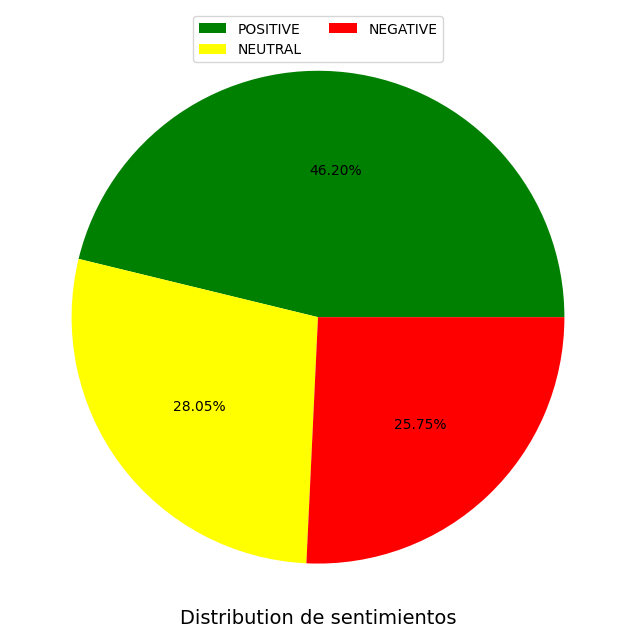

In [73]:
# distribution of sentiment
plt.figure(figsize = (8, 8))

labels = ['POSITIVE',"NEUTRAL",'NEGATIVE']
colors = ['green', 'yellow','red']
plt.pie(data['sentimentSIA'].value_counts(), autopct='%0.2f%%',colors=colors)

plt.title('Distribution de sentimientos', size=14, y=-0.01)
plt.legend(labels, ncol=2, loc=9)
plt.show()

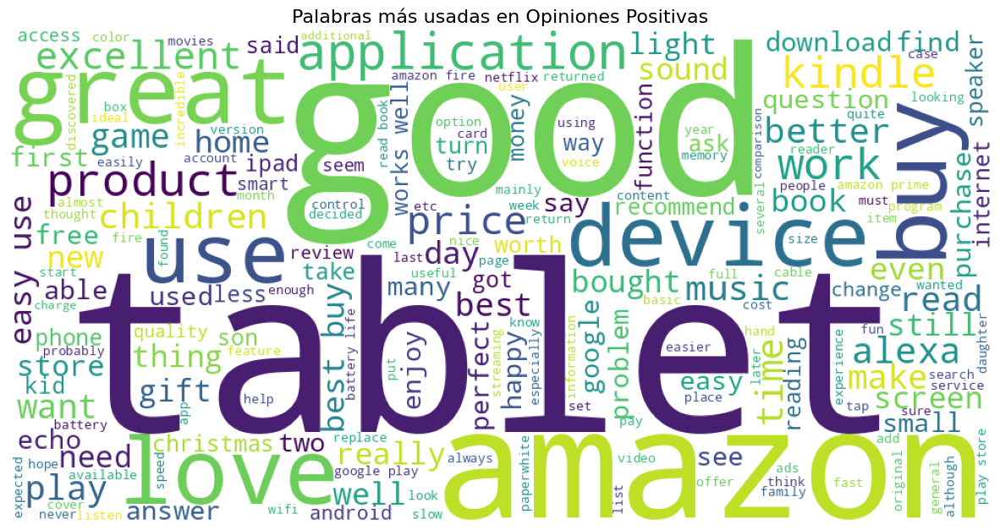

In [74]:
# get words used positive reivews
negativeWords = pd.Series(' '.join(data[data['sentimentSIA']=='POSITIVE']["TextTraducido"]).split())
# plot word cloud
wordcloud = WordCloud(width = 1000, height = 500, background_color='white').generate(' '.join(negativeWords))

plt.figure(figsize=(15,8))

plt.imshow(wordcloud)
plt.title("Palabras más usadas en Opiniones Positivas", size=16)

plt.axis("off")
plt.show()

In [75]:
data.describe()

,reviews.rating,sentiment_score,SentimenDictPorcPos,SentimenDictPorcNeg,neg,neu,pos,compaund
count,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,3.000000,0.40000,14.909669,4.777480,0.086249,0.587985,0.325770,0.431484
std,1.414567,0.49002,12.109440,8.235911,0.120148,0.187759,0.206778,0.466012
min,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.911800
25%,2.000000,0.00000,6.250000,0.000000,0.000000,0.458000,0.179750,0.102700
50%,3.000000,0.00000,13.043478,0.000000,0.000000,0.588000,0.318000,0.599400
75%,4.000000,1.00000,20.000000,7.692308,0.151000,0.707000,0.480000,0.807400
max,5.000000,1.00000,100.000000,100.000000,1.000000,1.000000,1.000000,0.994800


#### *Conclusion 1*

* Los modelos de bag of words son muy buenos a la hora de identificar textos de polaridades claras pero le cuesta mucho cuando los textos presentan polaridades inconcinas.

* para esto se utilizan modelos mas poderosos como transformers, modelos de aprendizaje supervisado y algunas aplicaciones de aprendizaje no supervisado.

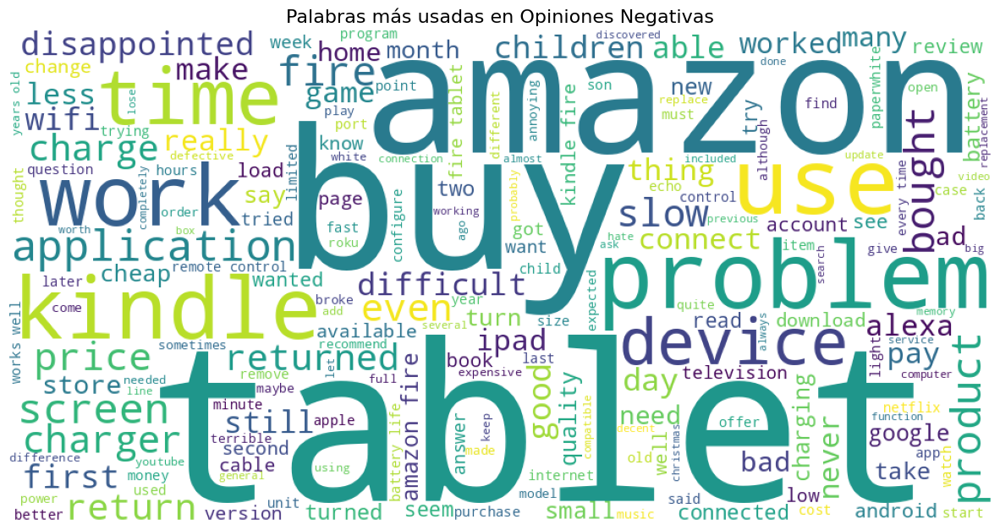

In [76]:
# get words used positive reivews
negativeWords = pd.Series(' '.join(data[data['sentimentSIA']=='NEGATIVE']["TextTraducido"]).split())
# plot word cloud
wordcloud = WordCloud(width = 1000, height = 500, background_color='white').generate(' '.join(negativeWords))

plt.figure(figsize=(15,8))

plt.imshow(wordcloud)
plt.title("Palabras más usadas en Opiniones Negativas", size=16)

plt.axis("off")
plt.show()

### Modelado de temas con [Gensim](https://radimrehurek.com)

Con los datos tokenizados vamos a cargar la primero utilizaremos la librería  [gensim](https://radimrehurek.com/gensim/index.html) que contiene múltiples  funciones que facilitan el modelado de temas.

El primer paso es generar una representación de diccionario del documento, esto en términos de [gensim](https://radimrehurek.com/gensim/index.html), implica crear un mapeo entre palabras y un identificador.

In [77]:
import spacy

# Cargamos el modelo para el idioma deseado (por ejemplo, español)
nlp = spacy.load("en_core_web_sm")

In [78]:
# Convert a specific column to strings
data['TextTraducido'] = data['TextTraducido'].astype(str)

In [79]:
def tokenizar (comentario):
  Tokenizado = [token.text for token in nlp(comentario) if len(token) > 2]
  return Tokenizado


text_tokenizado = list(map(tokenizar, data['TextTraducido']))

In [80]:
data['Tokenizado'] = text_tokenizado
data

,id,reviews.text,reviews.rating,reviews.text_esp,sentiment_score,sentiment,text,text_stemmed,TextTraducido,TextTraducidoStem,SentimenDictPorcPos,SentimenDictPorcNeg,sentimentPorc,neg,neu,pos,compaund,sentimentSIA,Tokenizado
0,AVqVGWQDv8e3D1O-ldFr,This is a very nice tablet for my GF who has never had one before.,5,Esta es una tableta muy agradable para mi novia que nunca antes había tenido una.,1,POSITIVE,tableta agradable novia nunca habia,tableta agradable novia nunca habi,tablet nice girlfriend never,tablet nice girlfriend never,25.000000,0.000000,POSITIVE,0.000,0.517,0.483,0.4215,NEUTRAL,"[tablet, nice, girlfriend, never]"
1,AVqkIhwDv8e3D1O-lebb,Love this tablet. Easy to use. And price was right,5,Me encanta esta tableta. Fácil de usar. Y el precio era correcto,1,POSITIVE,encanta tableta facil usar precio correcto,encanta tableta facil usar precio correct,love tablet easy use right price,love tablet easi use right price,50.000000,0.000000,POSITIVE,0.000,0.360,0.640,0.7964,NEUTRAL,"[love, tablet, easy, use, right, price]"
2,AVphgVaX1cnluZ0-DR74,Affordable price awesome quality I love my Amazon fire tablet,5,Precio asequible calidad increíble Me encanta mi tableta Amazon Fire,1,POSITIVE,precio asequible calidad increible encanta tableta amazon fire,precio asequible calidad increible encanta tableta amazon fir,affordable price amazing quality love amazon fire tablet,afford price amaz qualiti love amazon fire tablet,37.500000,0.000000,POSITIVE,0.149,0.248,0.602,0.8074,POSITIVE,"[affordable, price, amazing, quality, love, amazon, fire, tablet]"
3,AVphgVaX1cnluZ0-DR74,I bought this after speaking with a sales rep in Tigertown. I bought this for my kid and he loves it. Its my 2nd kindle.,5,Compré esto después de hablar con un representante de ventas en Tigertown. Compré esto para mi hijo y le encanta. Es mi segundo kindle.,1,POSITIVE,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindle,compre despues hablar representante ventas tigertown compre hijo encanta segundo kindl,buy later talk sales representative tigertown buy son loves second kindle,buy later talk sale repres tigertown buy son love second kindl,9.090909,0.000000,POSITIVE,0.000,0.730,0.270,0.5719,NEUTRAL,"[buy, later, talk, sales, representative, tigertown, buy, son, loves, second, kindle]"
4,AVqVGWLKnnc1JgDc3jF1,Bought this tablet for my 2 &1/2 year old and it is perfect. Games and videos that come on it are very age appropriate and the tablet has been very durable thus far.,5,Compré esta tableta para mi hijo de 2 años y medio y es perfecta. Los juegos y videos que vienen son muy apropiados para la edad y la tableta ha sido muy duradera hasta ahora.,1,POSITIVE,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahora,compre tableta hijo años medio perfecta juegos videos vienen apropiados edad tableta sido duradera ahor,buy tablet son years old perfect games videos come age appropriate tablet durable,buy tablet son year old perfect game video come age appropri tablet durabl,23.076923,0.000000,POSITIVE,0.000,0.764,0.236,0.5719,NEUTRAL,"[buy, tablet, son, years, old, perfect, games, videos, come, age, appropriate, tablet, durable]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,AVpfl8cLLJeJML43AE3S,I'm returning it because a new version is coming i,1,Lo devuelvo porque viene una nueva versión,0,NEGATIVE,devuelvo viene nueva version,devuelvo viene nueva version,I return new version comes,i return new version come,0.000000,0.000000,NEUTRAL,0.000,1.000,0.000,0.0000,NEGATIVE,"[return, new, version, comes]"
1996,AVpfiBlyLJeJML43-4Tp,I was surprised to find it did not come with any type of charging cords so I had to purchase one and then found my Sprint HTC 3D charger is faster. I would not purchase again- 1st item I've ever not liked I've purchased from Amazon,1,"Me sorprendió descubrir que no venía con ningún tipo de cable de carga, así que tuve que comprar 

### Modelado de temas con [Gensim](https://radimrehurek.com)

Con los datos tokenizados vamos a cargar la primero utilizaremos la librería  [gensim](https://radimrehurek.com/gensim/index.html) que contiene múltiples  funciones que facilitan el modelado de temas.

El primer paso es generar una representación de diccionario del documento, esto en términos de [gensim](https://radimrehurek.com/gensim/index.html), implica crear un mapeo entre palabras y un identificador.

In [81]:
pip install gensim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 64.3 MB/s eta 0:00:00


In [82]:
# Cargamos la función
from gensim.corpora import Dictionary

# Creamos la representación de diccionario del documento
dictionary = Dictionary(text_tokenizado)
dictionary

Ahora haremos un paso opcional, y es el uso de la función `filter_extremes` para remover palabras que aparecen en menos de 20 páginas o en más de 50% de las páginas:

In [83]:
dictionary.filter_extremes(no_below=20, no_above=0.5)

Estamos en condiciones de vectorizar el documento usando la función `doc2bow` que va a crear el corpus con la matriz de frecuencia de los documentos:

In [84]:
corpus = [dictionary.doc2bow(doc) for doc in text_tokenizado]

Con esto podemos ver el número de palabras únicas con el que vamos a estimar LDA:

In [85]:
print('Numero de palabras únicas: %d' % len(dictionary))

Numero de palabras únicas: 355


Estamos listos para estimar LDA utilizando la función [LDAModel](https://radimrehurek.com/gensim/models/ldamodel.html?highlight=ldamodel#module-gensim.models.ldamode) disponible en [gensim](https://radimrehurek.com/gensim/index.html). Carguemos entonces esta función:

In [86]:
from gensim.models import LdaModel

Antes de apicarla, discutiremos algunos de los parámetros:

   - `corpus` es donde especificamos la matriz de frecuencia de los documentos.
   
   - `id2word` es donde especificamos el diccionario que mapea palabras con identificadores, este sirve para determinar el tamaño del vocabulario y para mostrar luego los temas con las palabras encontradas.
   
   - `num_topics` donde especificamos el número de temas a buscar.  
   
   - `chunksize` controla cuántos documentos se procesan a la vez en el entrenamiento. Aumentar el tamaño de los fragmentos acelerará el entrenamiento, siempre y cuando el fragmento de documentos entre fácilmente en la memoria.  
   
   - `passes` controla la frecuencia con la que entrenamos el modelo en todo el corpus.
   
   - `iterations` controla la frecuencia con la que repetimos un bucle particular sobre cada documento. Cuando entrenamos  es importante establecer el número de "passes" e "iterations" lo suficientemente alto.
   
   - `alpha` es el parámetro que controla el "prior" de la distribución de temas.
   
   - `eta` es el parámetro que controla el "prior" de la distribución de palabras-temas.
   
Estimemos el modelo:

In [87]:
Estimacion = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=7,
    chunksize=1000,
    passes=20,
    iterations=400,
    alpha='auto',
    eta='auto',
    random_state=123,
    eval_every=None
)

Con el modelo estimado podemos utilizar pprint para ver los temas con las palabras asociadas y su peso dentro del tema.

In [88]:
from pprint import pprint

pprint(Estimacion.print_topics())

[(0,
  '0.037*"buy" + 0.029*"would" + 0.027*"product" + 0.021*"bought" + '
  '0.021*"device" + 0.021*"time" + 0.021*"worked" + 0.021*"well" + '
  '0.020*"returned" + 0.020*"return"'),
 (1,
  '0.085*"use" + 0.067*"easy" + 0.046*"years" + 0.043*"tablet" + 0.034*"son" + '
  '0.030*"old" + 0.030*"buy" + 0.029*"love" + 0.025*"bought" + '
  '0.021*"children"'),
 (2,
  '0.084*"tablet" + 0.067*"good" + 0.049*"price" + 0.042*"great" + '
  '0.036*"well" + 0.032*"works" + 0.024*"excellent" + 0.023*"children" + '
  '0.023*"product" + 0.022*"slow"'),
 (3,
  '0.102*"kindle" + 0.052*"read" + 0.047*"books" + 0.024*"reading" + '
  '0.022*"love" + 0.022*"light" + 0.020*"paperwhite" + 0.019*"page" + '
  '0.017*"buy" + 0.015*"reader"'),
 (4,
  '0.064*"tablet" + 0.040*"amazon" + 0.032*"screen" + 0.025*"charger" + '
  '0.024*"buy" + 0.024*"fire" + 0.018*"good" + 0.017*"kindle" + 0.017*"store" '
  '+ 0.015*"play"'),
 (5,
  '0.045*"music" + 0.034*"alexa" + 0.028*"echo" + 0.025*"home" + '
  '0.024*"questions" 

Podemos también generar una visualización interactiva de los resultados utilizando [pyLDAvis](https://pyldavis.readthedocs.io/en/latest/readme.html) que permite ayudar a la interpretación de los temas:

In [89]:
pip install pyLDAvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 68.1 MB/s eta 0:00:00


In [90]:
# Visualizamos los resultados
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

pyLDAvis.enable_notebook()
LDA_visualization = gensimvis.prepare(Estimacion, corpus, dictionary)
LDA_visualization

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
6     -0.096074 -0.044870       1        1  22.631411
0     -0.160954  0.009742       2        1  15.446320
4     -0.004520 -0.079244       3        1  14.864732
2      0.092898 -0.125989       4        1  13.452616
5     -0.111824 -0.017981       5        1  12.576322
1      0.256559  0.001780       6        1  10.720525
3      0.023915  0.256562       7        1  10.308073, topic_info=       Term        Freq       Total Category  logprob  loglift
11   kindle  314.000000  314.000000  Default  30.0000  30.0000
2    tablet  660.000000  660.000000  Default  29.0000  29.0000
6       use  484.000000  484.000000  Default  28.0000  28.0000
3      easy  206.000000  206.000000  Default  27.0000  27.0000
78    music  136.000000  136.000000  Default  26.0000  26.0000
..      ...         ...         ...      ...      ...      ...
112   would   25.860695  333.387385   Topic7  -4.5504  -0.2843
121    time   22.991398  218.385099   Topic7  -4.6680   0.0211
3      easy   21.236365  206.694477   Topic7  -4.7474  -0.0033
80   really   20.760663  132.156618   Topic7  -4.7700   0.4213
53   better   20.344195  134.774007   Topic7  -4.7903   0.3814

[359 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
45        4  0.154065   Alexa
45        5  0.808841   Alexa
139       1  0.213389  Amazon
139       2  0.557181  Amazon
139       3  0.035565  Amazon
...     ...       ...     ...
90        1  0.236235    year
90        3  0.147647    year
90        7  0.590588    year
21        1  0.099889   years
21        6  0.899000   years

[830 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[7, 1, 5, 3, 6, 2, 4])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


### Eligiendo el número de temas

Elegir el número de tópicos,  como el número de clusters en K-medias, es un paso clave. La pregunta natural que surge es si existe algún método para hacerlo. Desafortunadamente, no existe una forma objetiva aceptada en la literatura de responderla. Sin embargo, hay 2 métodos  que pueden servir de guía.

#### Medida de Coherencia

Decimos que hechos, documentos o enunciados son coherentes, si se apoyan entre sí.  Un ejemplo de un conjunto de hechos coherente es "el juego es un deporte de equipo", “el juego se juega con una pelota”, “el juego exige un gran esfuerzo físico”. El problema fundamental es cómo medir esta coherencia en los datos. Röder et al. (2015) proponen una forma de hacerlo que consiste en 4 pasos que se muestran en la figura y describimos brevemente (los invito a leer el artículo original para los detalles matemáticos):

Figura

Comenzando con el tópico  que queremos evaluar (t), elegimos un corpus de referencia, y las n-palabras más importantes del tópico  que llamamos $W$:

1. En el primer paso segmentamos el conjunto $W$ creando pares de palabras. Por ejemplo si tenemos las palabras $W={perro, gato, conejo}$ y la segmentamos una a una vamos a tener: $S={(perro,gato),(perro,conejo),(gato,perro),(gato,conejo),(conejo,perro),(conejo,gato)}$. Existen múltiples formas de segmentar, pero la idea es que dependiendo la segmentación, la medida de coherencia va a estar interesada en estos conjuntos resultantes.

2. Usando el corpus de referencia, en el segundo definimos y calculamos la probabilidad de ocurrencia de distintas palabras dentro del texto.  Al igual que en el paso anterior, se pueden definir distintas formas de calcular estas probabilidades.

3. Con las palabras segmentadas y las probabilidades, utilizamos una medida de confirmación para evaluar la relación entre los subconjuntos creados en el paso de segmentación. Esto nos dice cuán fuerte es la relación de estos subconjuntos. Esto se pueden hacer por medidas de confirmación directa o indirecta, que están  más allá de este curso.

4. Agregación, toma los valores calculados en el paso anterior y se los agrega en un solo resultado que da la medida de coherencia del tópico. Aquí también existen varias formas de hacer la agregación, por ejemplo, la media, la mediana, etc.


[Gensim](https://radimrehurek.com/gensim/index.html) implementa esta medida a través de la función [CoherenceModel](https://radimrehurek.com/gensim/models/coherencemodel.html) que implementa los 4 pasos anteriores. La función requiere como insumos el modelo estimado, el corpus y el diccionario.

In [91]:
from gensim.models import CoherenceModel

coherencemodel = CoherenceModel(model=Estimacion, texts=text_tokenizado, dictionary=dictionary)
coherencemodel.get_coherence()

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

np.float64(0.5052288731783041)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


Obtuvimos una coherencia de 0.51, sin embargo, este número no tiene interpretación directa. Sirve sólo en un contexto donde se compara con otros modelos con diferentes números de temas, y escogeremos aquella con mayor coherencia.

Ilustremos esto creando una función que itere a lo largo de distinto número de temas y devuelve la medida de coherencia. Adicionalmente, aprovecharemos que [Gensim](https://radimrehurek.com/gensim/index.html) tiene una implementación de LDA ([LdaMulticore](https://radimrehurek.com/gensim/models/ldamulticore.html)) que paraleliza y acelera la estimación del modelo:

In [92]:
from gensim.models.ldamulticore import LdaMulticore

def calcular_coherencia(dictionary, corpus, texts, start=1, limit=10, step=1):

    coherence_values = []
    model_list = []

    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus,
                        id2word=dictionary,
                        num_topics=num_topics,
                        random_state=123,
                        passes=20)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

La función además de los insumos esenciales para la estimación de LDA, tiene además un punto de inicio, finalización y tamaño de paso para el rango de temas a estimar:

In [93]:
modelos, valores_c = calcular_coherencia(dictionary=dictionary, corpus=corpus, texts=text_tokenizado, start=1, limit=10, step=1)

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcno

Graficamos los resultados:

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

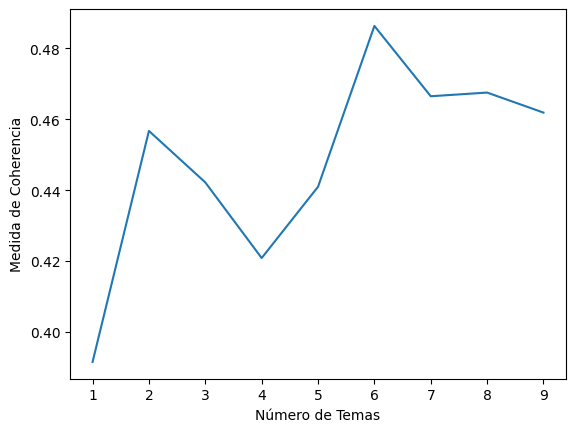

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [94]:
import matplotlib.pyplot as plt
# Show graph
limit=10; start=1; step=1;
x = range(start, limit, step)
plt.plot(x, valores_c)
plt.xlabel("Número de Temas")
plt.ylabel("Medida de Coherencia")
plt.show()

La medida de coherencia sugiere que hay 4 tipos de temas en estas páginas, visualicemos entonces los resultados:

In [95]:
lda_model_opt = LdaMulticore(corpus = corpus,
    id2word = dictionary,
    num_topics = 6,
    random_state=123)
pyLDAvis.enable_notebook()
LDA_visualization = gensimvis.prepare(lda_model_opt, corpus, dictionary)
LDA_visualization

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcno

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.013493 -0.003150       1        1  23.713603
0     -0.006469 -0.007890       2        1  17.531364
2      0.026322  0.010960       3        1  16.902222
5     -0.040308 -0.031116       4        1  16.015757
3      0.032157 -0.013344       5        1  14.338626
1     -0.025194  0.044541       6        1  11.498428, topic_info=       Term        Freq       Total Category  logprob  loglift
6       use  494.000000  494.000000  Default  30.0000  30.0000
11   kindle  304.000000  304.000000  Default  29.0000  29.0000
8      fire  297.000000  297.000000  Default  28.0000  28.0000
4      love  231.000000  231.000000  Default  27.0000  27.0000
73     good  465.000000  465.000000  Default  26.0000  26.0000
..      ...         ...         ...      ...      ...      ...
60     play   21.418474  191.411754   Topic6  -4.8481  -0.0272
10      buy   24.939919  544.249742   Topic6  -4.6959  -0.9200
155     get   19.916540  197.520283   Topic6  -4.9208  -0.1313
5     price   19.767742  232.526652   Topic6  -4.9283  -0.3020
55   bought   18.788918  191.526409   Topic6  -4.9791  -0.1588

[372 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
45        1  0.034984    Alexa
45        2  0.069968    Alexa
45        3  0.454793    Alexa
45        4  0.279873    Alexa
45        5  0.069968    Alexa
...     ...       ...      ...
345       2  0.070113  youtube
345       3  0.070113  youtube
345       4  0.280453  youtube
345       5  0.035057  youtube
345       6  0.140227  youtube

[1261 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 1, 3, 6, 4, 2])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [96]:
Promotores=data[data['sentimentSIA']=='POSITIVE']['TextTraducido']
Detractores=data[data['sentimentSIA']=='NEGATIVE']['TextTraducido']

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

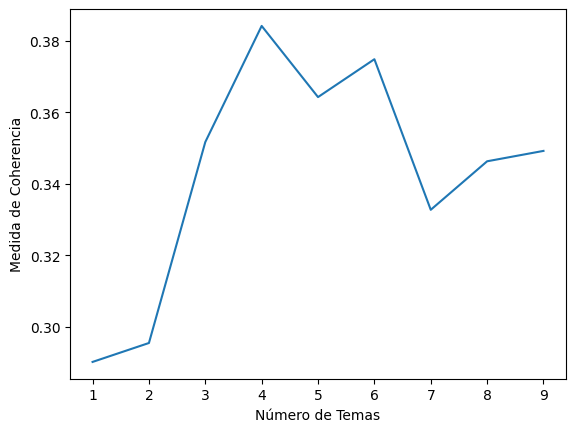

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [97]:
def FindTopics (Text):
  TextToken = list(map(tokenizar, Text))
  dictionary = Dictionary(TextToken)
  dictionary.filter_extremes(no_below=20, no_above=0.5)
  corpus = [dictionary.doc2bow(doc) for doc in TextToken]
  modelos, valores_c = calcular_coherencia(dictionary=dictionary, corpus=corpus, texts=TextToken, start=1, limit=10, step=1)
  import matplotlib.pyplot as plt
  limit=10; start=1; step=1;
  x = range(start, limit, step)
  plt.plot(x, valores_c)
  plt.xlabel("Número de Temas")
  plt.ylabel("Medida de Coherencia")
  plt.show()
  return modelos, corpus,dictionary




modelP, corpP, dicP=FindTopics(Promotores)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

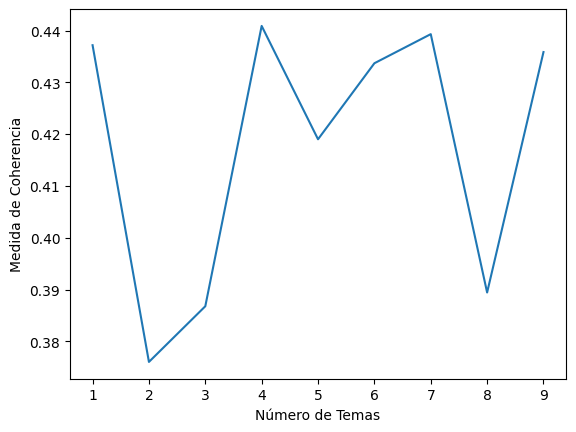

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [98]:
modelD, corpD, dicD=FindTopics(Detractores)

In [99]:
lda_model_opt = LdaMulticore(corpus = corpP,
    id2word = dicP,
    num_topics = 4,
    random_state=123)
pyLDAvis.enable_notebook()
LDA_visualization = gensimvis.prepare(lda_model_opt, corpP, dicP)
LDA_visualization

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replac

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.021116 -0.007200       1        1  34.263331
0      0.023680 -0.006237       2        1  28.211220
1     -0.034211 -0.018707       3        1  19.180030
3     -0.010586  0.032144       4        1  18.345419, topic_info=         Term        Freq       Total Category  logprob  loglift
66     kindle  105.000000  105.000000  Default  30.0000  30.0000
32  excellent   80.000000   80.000000  Default  29.0000  29.0000
67       like  126.000000  126.000000  Default  28.0000  28.0000
0      amazon  210.000000  210.000000  Default  27.0000  27.0000
50     screen   56.000000   56.000000  Default  26.0000  26.0000
..        ...         ...         ...      ...      ...      ...
38       good   17.132098  179.118285   Topic4  -4.1712  -0.6513
50     screen   10.668076   56.526496   Topic4  -4.6449   0.0283
34        use   14.460329  163.483583   Topic4  -4.3408  -0.7295
8      device   12.094080  107.909196   Topic4  -4.5195  -0.4928
67       like   11.023840  126.015505   Topic4  -4.6121  -0.7406

[216 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
96        1  0.276806    able
96        2  0.246050    able
96        3  0.184537    able
96        4  0.276806    able
97        1  0.154310  access
...     ...       ...     ...
61        4  0.184203   would
58        1  0.326680   years
58        2  0.435573   years
58        3  0.108893   years
58        4  0.136117   years

[424 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 2, 4])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [100]:
from pprint import pprint

pprint(lda_model_opt.print_topics())

[(0,
  '0.046*"buy" + 0.045*"use" + 0.029*"easy" + 0.029*"good" + 0.028*"amazon" + '
  '0.027*"tablet" + 0.025*"play" + 0.024*"like" + 0.024*"product" + '
  '0.024*"would"'),
 (1,
  '0.045*"amazon" + 0.042*"tablet" + 0.038*"like" + 0.033*"buy" + 0.027*"love" '
  '+ 0.023*"device" + 0.022*"screen" + 0.021*"would" + 0.021*"applications" + '
  '0.017*"children"'),
 (2,
  '0.050*"good" + 0.044*"great" + 0.032*"tablet" + 0.030*"amazon" + '
  '0.027*"use" + 0.024*"love" + 0.023*"buy" + 0.020*"device" + 0.019*"price" + '
  '0.018*"read"'),
 (3,
  '0.044*"kindle" + 0.043*"amazon" + 0.039*"tablet" + 0.036*"buy" + '
  '0.036*"excellent" + 0.027*"love" + 0.023*"great" + 0.020*"would" + '
  '0.016*"better" + 0.016*"alexa"')]


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [101]:
lda_model_opt = LdaMulticore(corpus = corpD,
    id2word = dicD,
    num_topics = 4,
    random_state=123)
pyLDAvis.enable_notebook()
LDA_visualization = gensimvis.prepare(lda_model_opt, corpD, dicD)
LDA_visualization

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.041565 -0.018335       1        1  29.213414
3     -0.075759  0.020950       2        1  26.640614
0     -0.004355 -0.057103       3        1  24.115051
2      0.038549  0.054489       4        1  20.030921, topic_info=        Term        Freq       Total Category  logprob  loglift
8     kindle   95.000000   95.000000  Default  30.0000  30.0000
17       buy  146.000000  146.000000  Default  29.0000  29.0000
42   charger   49.000000   49.000000  Default  28.0000  28.0000
4   download   26.000000   26.000000  Default  27.0000  27.0000
57      many   29.000000   29.000000  Default  26.0000  26.0000
..       ...         ...         ...      ...      ...      ...
52      time   10.539805   60.656017   Topic4  -3.9920  -0.1422
21       use   17.153429  102.286639   Topic4  -3.5050  -0.1777
17       buy   18.107480  146.286776   Topic4  -3.4509  -0.4814
8     kindle   13.031505   95.196810   Topic4  -3.7798  -0.3807
19   product    8.070207   46.517022   Topic4  -4.2590  -0.1437

[173 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
49        1  0.557335  Amazon
49        2  0.171488  Amazon
49        3  0.171488  Amazon
49        4  0.128616  Amazon
46        1  0.320314    able
...     ...       ...     ...
10        4  0.057224   would
36        1  0.128490   years
36        2  0.706694   years
36        3  0.096367   years
36        4  0.064245   years

[247 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 4, 1, 3])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [102]:
from pprint import pprint

pprint(lda_model_opt.print_topics())

[(0,
  '0.095*"tablet" + 0.037*"use" + 0.035*"charger" + 0.034*"would" + '
  '0.032*"disappointed" + 0.032*"amazon" + 0.030*"fire" + 0.030*"price" + '
  '0.029*"device" + 0.028*"also"'),
 (1,
  '0.065*"fire" + 0.061*"amazon" + 0.057*"buy" + 0.049*"tablet" + 0.037*"time" '
  '+ 0.035*"use" + 0.034*"could" + 0.032*"screen" + 0.032*"work" + '
  '0.030*"would"'),
 (2,
  '0.054*"tablet" + 0.050*"works" + 0.046*"fire" + 0.043*"problem" + '
  '0.040*"amazon" + 0.040*"get" + 0.035*"many" + 0.032*"download" + '
  '0.032*"less" + 0.032*"buy"'),
 (3,
  '0.096*"buy" + 0.084*"kindle" + 0.044*"would" + 0.040*"use" + 0.036*"tablet" '
  '+ 0.031*"children" + 0.029*"charger" + 0.029*"years" + 0.027*"applications" '
  '+ 0.024*"pay"')]


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

#### Medida de Perplejidad

Otra de las medidas utilizadas, es la medida de Perplejidad. A diferencia de la medida de coherencia lo que buscaremos es minimizar la perplejidad.

Esta medida calcula el número de palabras diferentes que son igualmente probables a seguir a cualquier palabra dada. Para aclarar qué queremos decir con esto, consideremos un ejemplo con 2 palabras: *el* y *anunciar*. La palabra *el* puede anteceder a una gran cantidad de palabras de igual probabilidad, mientras que el número de palabras de igual probabilidad que anteceden a *anunciar* será relativamente menor.

La idea intuitiva es que palabras que, en promedio, pueden ir seguidas de un menor número de palabras de igual probabilidad, son más específicas y por lo tanto  pueden estar más estrechamente vinculadas a los tópicos. Entonces puntuaciones más bajas de perplejidad implican mejores modelos de lenguaje.

El cálculo es sencillo usando  [gensim](https://radimrehurek.com/gensim/index.html); ya que tanto [LDAModel](https://radimrehurek.com/gensim/models/ldamodel.html?highlight=ldamodel#module-gensim.models.ldamode)  como  [LdaMulticore](https://radimrehurek.com/gensim/models/ldamulticore.html) retornan el límite por palabra de la verosimilitud, por lo que para convertirlo en perplejidad necesitamos hacer $perplejidad=2^{(-limite)}$:

Dado que nos interesa minimizar esta perplejidad comparemos esta medida para distinto números de temas. Crearemos entonces una función similar a la que construimos en la sección anterior:

In [103]:
def perplejidad_ntemas(dictionary, corpus, texts, start=1, limit=10, step=1):

    perplejidad_values = []
    model_list = []

    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus,
                        id2word=dictionary,
                        num_topics=num_topics,
                        random_state=123,
                        passes=20)
        model_list.append(model)
        perplejidad_values.append(np.exp2(-model.log_perplexity(corpus)))

    return model_list, perplejidad_values

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [104]:
modelos, valores_p = perplejidad_ntemas(dictionary=dicP, corpus=corpP, texts=Promotores, start=1, limit=10, step=1)

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcno

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

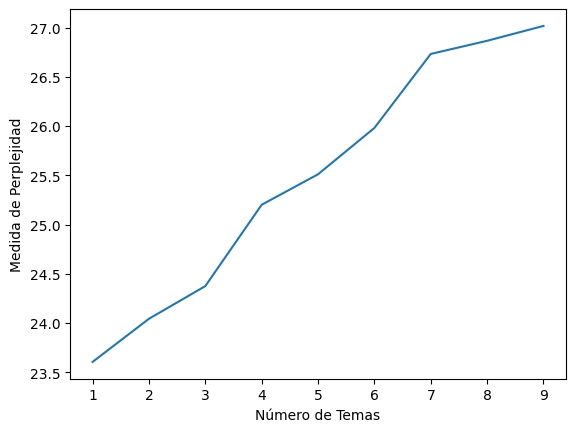

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [105]:
import matplotlib.pyplot as plt
# Show graph
limit=10; start=1; step=1;
x = range(start, limit, step)
plt.plot(x, valores_p)
plt.xlabel("Número de Temas")
plt.ylabel("Medida de Perplejidad")

plt.show()

In [ ]:
modelos, valores_p = perplejidad_ntemas(dictionary=dicD, corpus=corpD, texts=Detractores, start=1, limit=10, step=1)

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcno

In [107]:
import matplotlib.pyplot as plt
# Show graph
limit=10; start=1; step=1;
x = range(start, limit, step)
plt.plot(x, valores_p)
plt.xlabel("Número de Temas")
plt.ylabel("Medida de Perplejidad")

plt.show()